In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import folium
from folium.plugins import HeatMap

/var/folders/8j/ybqbv42143jfglvsf83t5s_c0000gn/T/ipykernel_90297/4036460086.py:1: DeprecationWarning: 
Pyarrow will become a required dependency of pandas in the next major release of pandas (pandas 3.0),
(to allow more performant data types, such as the Arrow string type, and better interoperability with other libraries)
but was not found to be installed on your system.
If this would cause problems for you,
please provide us feedback at https://github.com/pandas-dev/pandas/issues/54466
        
  import pandas as pd


In [2]:
# load csv file
df = pd.read_csv('../data/permit-time-training.csv')
df.head(5)

,number_of_units,longitude,latitude,building_type,request_code,approval_time
0,1.0,-73.869902,45.505224,24.0,1.0,2.0
1,0.0,-73.873945,45.501934,24.0,3.0,1.0
2,0.0,-73.930681,45.492434,4.0,2.0,47.0
3,1.0,-73.930681,45.492434,24.0,1.0,47.0
4,0.0,-73.930681,45.492434,24.0,1.0,47.0


In [3]:
# removing outliers from the data, i.e., more than 400 days and less than 1 day
df = df[df['approval_time'] < 400]
df = df[df['approval_time'] > 1]

In [4]:
new_df = df[['latitude', 'longitude', 'approval_time']]
new_df = new_df.dropna()
new_df.head(5)

,latitude,longitude,approval_time
0,45.505224,-73.869902,2.0
2,45.492434,-73.930681,47.0
3,45.492434,-73.930681,47.0
4,45.492434,-73.930681,47.0
5,45.491245,-73.883399,6.0


In [5]:
# remove duplicate rows
new_df = new_df.drop_duplicates()



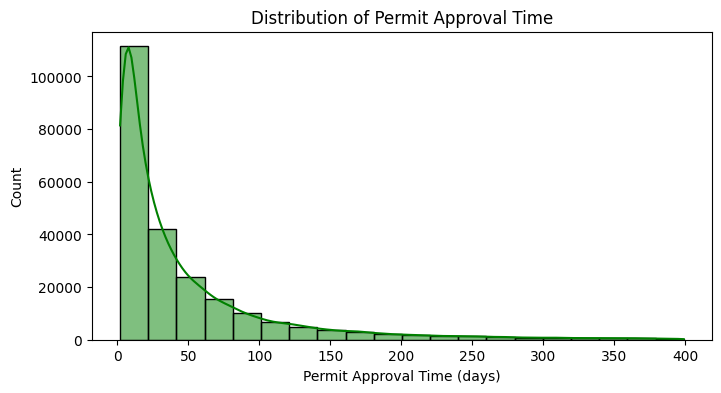

In [6]:
# distribution of approval time
import seaborn as sns
plt.figure(figsize=(8, 4))
sns.histplot(df['approval_time'], kde=True, bins=20, color='g')
plt.title('Distribution of Permit Approval Time')
plt.xlabel('Permit Approval Time (days)')
plt.ylabel('Count')
plt.show()

In [7]:
# Define the color ranges
color_ranges = [0, 30, 90, 180, float('inf')]
colors = ['#0074D9', '#2ECC40', '#FF851B', '#FF4136']

# Assign colors based on permit approval times

new_df['Color'] = pd.cut(new_df['approval_time'], bins=color_ranges, labels=colors)

# Create a folium map centered around Montreal
montreal_map = folium.Map(location=[45.5017, -73.5673], zoom_start=12)

# Create a HeatMap layer
heat_data = new_df[['latitude', 'longitude', 'approval_time']].values.tolist()
HeatMap(heat_data, gradient={0.2: 'blue', 0.4: 'green', 0.7: 'orange', 1: 'red'}).add_to(montreal_map)

# Display the map
montreal_map

### Note that the folium heatmap is not clear and do not give a clear indication on this.

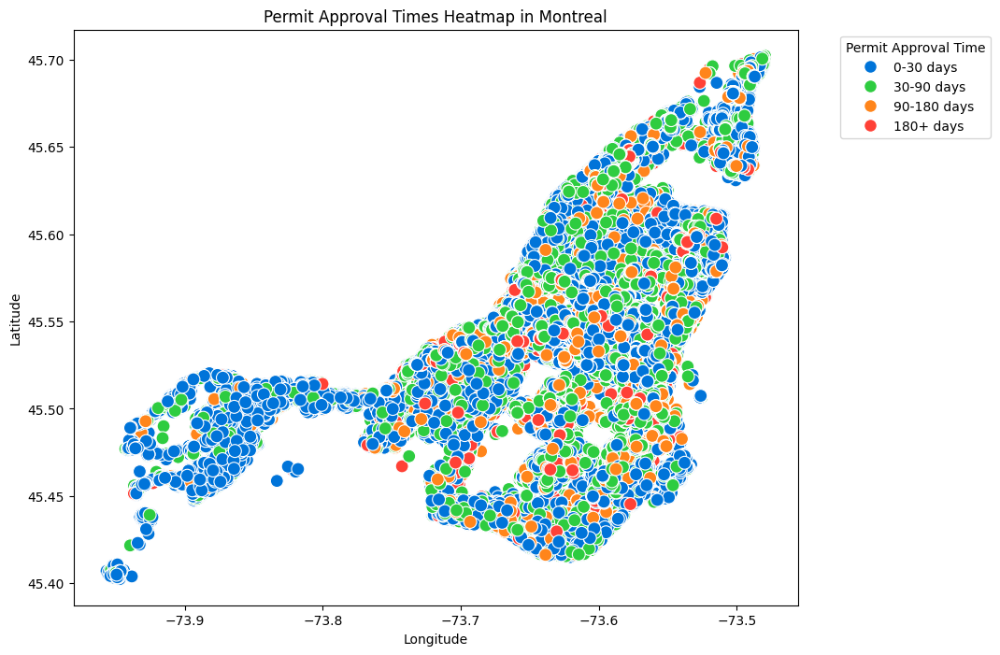

In [8]:
# Plot the heatmap
plt.figure(figsize=(10, 8))
sns.scatterplot(x='longitude', y='latitude', hue='Color', palette=colors, data=new_df, s=100)
plt.title('Permit Approval Times Heatmap in Montreal')
plt.xlabel('Longitude')
plt.ylabel('Latitude')

# Customize the legend labels
legend_labels = {
    '#0074D9': '0-30 days',
    '#2ECC40': '30-90 days',
    '#FF851B': '90-180 days',
    '#FF4136': '180+ days'
}

legend_handles = [plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=color, markersize=10) for color in colors]
plt.legend(title='Permit Approval Time', handles=legend_handles, labels=legend_labels.values(), bbox_to_anchor=(1.05, 1), loc='upper left')

# Add names of major boroughs
boroughs = {'Downtown': (45.5048, -73.5772), 'Plateau-Mont-Royal': (45.5183, -73.5790), 'Côte-des-Neiges': (45.4949, -73.6115)}

# for borough, (lat, lon) in boroughs.items():
#     plt.annotate(borough, (lon, lat), textcoords="offset points", xytext=(-10,5), ha='center', fontsize=8, color='black')

plt.show()


In [ ]:
# do the save plot to represent the fastest approval times, i.e., less than 30 days and make all other grey
# Filter DataFrame for permit approval times less than 7 days

# red_df = new_df[new_df['approval_time'] > 390]

# # Plot the blue points
# plt.figure(figsize=(10, 8))
# sns.scatterplot(x='longitude', y='latitude', hue='Color', palette=colors, data=red_df, s=100)
# plt.title('Fastest Permit Approval Times Heatmap in Montreal')
# plt.xlabel('Longitude')
# plt.ylabel('Latitude')

# plt.show()
